**Тема: Суміщення зображень на основі використання дескрипторів.**

**Мета: навчитись вирішувати задачу суміщення зображень засобом видобування особливих точок і викорисання їх в процедурах матчінгу**

                              **Варіант 1**
Завдання: Вибрати з інтернету набори зображень з різною контрастністю і різним флуктуаціями освітленості. Для кожного зображення побудувати варіант спотвореного (видозміненого зображення). Для кожної отриманої пари побудувати дескриптор і проаналізувати можливість суміщення цих зображень і з визначення параметрів геметричних перетворень (кут повороту, зміщень в напрямку х і напрямку y).
1. SIFT

Для перевірки збігів необхідно написати власну функцію матчінгу, а результати її роботи перевірити засобами OpenCV. Якщо повної реалізації дескриптора не має в OpenCV, то такий необхідно створити власну функцію побудови цих дискрипторів. У цьому випадку матчінг можна здійснювати стандартними засобами (якщо це можливо).

В процесі порівняння дескрипторів використати власну реалізацію
алгоритму RANSAC. Також враховується факт написання власної функції
побудови дескрипторів, без використання OpenCV.


FLOAT_TOLERANCE = 1e-7
Використовується для порівняння чисел з плаваючою точністю. Допомагає уникнути проблем, пов’язаних із неточністю обчислень при роботі з дуже малими значеннями.

CONTRAST_THRESHOLD = 0.04
Поріг контрастності для відбору кандидатів на ключові точки. Якщо контрастність (значення DoG) занадто мала, точка відкидається як непомітна.

EIGENVALUE_RATIO = 10
Визначає максимальне співвідношення власних чисел матриці Гессіана. Використовується для відсіювання точок, що лежать на ребрах, де визначення позиції є менш стабільним.

NUM_ATTEMPTS_UNTIL_CONVERGENCE = 5
Максимальна кількість ітерацій при уточненні положення екстремуму за допомогою квадратичної апроксимації. Якщо після 5 спроб не досягнуто збіжності, ключова точка відкидається.

ORIENTATION_RADIUS_FACTOR = 3
Множник, що визначає радіус області навколо ключової точки для обчислення орієнтації. Він множиться на масштаб точки для отримання розміру регіону.

ORIENTATION_NUM_BINS = 36
Кількість бінів у гістограмі орієнтації. 36 бінів забезпечують крок по 10° (360°/36) для точного визначення домінуючої орієнтації.

ORIENTATION_PEAK_RATIO = 0.8
Поріг для розгляду додаткових піків у гістограмі орієнтації. Якщо значення піка не менше 80% від максимального, то крім головного піка може бути створено кілька ключових точок з різними орієнтаціями.

ORIENTATION_SCALE_FACTOR = 1.5
Множник масштабу, який використовується для обчислення області навколо ключової точки при визначенні орієнтації.

DESCRIPTOR_WINDOW_WIDTH = 4
Ширина вікна дескриптора – зображення розбивається на 4×4 блоки, для кожного з яких обчислюється окрема гістограма градієнтів.

DESCRIPTOR_NUM_BINS = 8
Кількість бінів у кожному з блоків дескриптора. Зазвичай, 8 бінів забезпечують достатню деталізацію для опису локального розподілу градієнтів.

DESCRIPTOR_SCALE_MULTIPLIER = 3
Множник, який визначає розмір вікна дескриптора щодо масштабу ключової точки. Він впливає на розмір області, з якої обчислюється дескриптор.

DESCRIPTOR_MAX_VALUE = 0.2
Після обчислення дескриптора його нормалізують. Ця константа задає поріг, після якого значення дескриптора обрізаються (clipping) для зменшення впливу дуже сильних градієнтів, що допомагає підвищити стійкість до шуму.



In [ ]:
import numpy as np
from numpy.linalg import det, lstsq, norm
from cv2 import resize, GaussianBlur, subtract, KeyPoint, INTER_LINEAR, INTER_NEAREST
from functools import cmp_to_key
from google.colab.patches import cv2_imshow


FLOAT_TOLERANCE = 1e-7  # Допуск для порівняння чисел з плаваючою точкою
CONTRAST_THRESHOLD = 0.04  # Поріг контрастності для відбору ключових точок
EIGENVALUE_RATIO = 10  # Максимальне співвідношення власних чисел для відсіювання ребер
NUM_ATTEMPTS_UNTIL_CONVERGENCE = 5  # Максимальна кількість ітерацій для локалізації екстремуму
ORIENTATION_RADIUS_FACTOR = 3  # Множник радіусу для обчислення орієнтації
ORIENTATION_NUM_BINS = 36  # Кількість бінів у гістограмі орієнтації
ORIENTATION_PEAK_RATIO = 0.8  # Поріг для визначення піків орієнтації
ORIENTATION_SCALE_FACTOR = 1.5  # Множник масштабу для орієнтації
DESCRIPTOR_WINDOW_WIDTH = 4  # Ширина вікна дескриптора (4x4 гістограми)
DESCRIPTOR_NUM_BINS = 8  # Кількість бінів для кожної гістограми дескриптора
DESCRIPTOR_SCALE_MULTIPLIER = 3  # Множник масштабу для розміру вікна дескриптора
DESCRIPTOR_MAX_VALUE = 0.2  # Максимальне значення дескриптора після нормалізації

In [ ]:
def compute_keypoints_and_descriptors(image, sigma=1.6, num_intervals=3, assumed_blur=0.5, image_border_width=5):
    base_image = generate_base_image(image, sigma, assumed_blur)
    # Обчислюємо кількість октав на основі розміру базового зображення
    num_octaves = compute_number_of_octaves(base_image.shape)
    # Генеруємо ядра гаусового розмиття для кожної шкали
    gaussian_kernels = generate_gaussian_kernels(sigma, num_intervals)
    # Створюємо піраміду гаусових зображень
    gaussian_images = generate_gaussian_images(base_image, num_octaves, gaussian_kernels)
    # Генеруємо зображення різниці гаусів (DoG)
    dog_images = generate_dog_images(gaussian_images)
    # Знаходимо екстремуми в просторі масштабів для виявлення ключових точок
    keypoints = find_scale_space_extrema(gaussian_images, dog_images, num_intervals, sigma, image_border_width)
    # Видаляємо дублікати ключових точок
    keypoints = remove_duplicate_keypoints(keypoints)
    # Перетворюємо координати ключових точок до розміру вхідного зображення
    keypoints = convert_keypoints_to_input_image_size(keypoints)
    # Генеруємо дескриптори для кожної ключової точки
    descriptors = generate_descriptors(keypoints, gaussian_images)
    return keypoints, descriptors

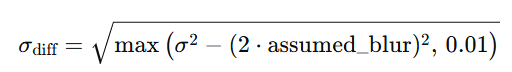

Адитивність дисперсій: Якщо зображення вже має певний ступінь розмиття (assumed_blur) і масштабування, то для досягнення бажаного загального 𝜎 потрібно додаткове розмиття, де 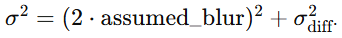

In [ ]:
def generate_base_image(image, sigma, assumed_blur):
    image = image.astype('float32')
    #Значення нового пікселя P(x,y) обчислюється як середньозважене значення кольорів цих чотирьох сусідніх пікселів
    image = resize(image, (0, 0), fx=2, fy=2, interpolation=INTER_LINEAR)
    #Це забезпечує, що після масштабування зображення має точно задану ступінь розмиття
    sigma_diff = np.sqrt(max((sigma ** 2) - ((2 * assumed_blur) ** 2), 0.01))
    return GaussianBlur(image, (0, 0), sigmaX=sigma_diff, sigmaY=sigma_diff)

Ця функція обчислює, скільки разів ми можемо неодноразово розділяти зображення навпіл, доки воно не стане замалим. Кінцеве зображення повинно мати довжину сторони принаймні 1 піксель. Ми можемо скласти для цього рівняння. Якщо y — менша довжина сторони зображення, тоді ми маємо y / 2^ x = 1, де x — кількість разів, коли ми можемо розділити базове зображення навпіл. Ми можемо взяти логарифм обох сторін і вирішити для x , щоб отримати log( y ) / log(2).

In [ ]:
def compute_number_of_octaves(image_shape):
    # Формула з OpenCV: log(мін_розмір) / log(2) - 1
    return int(np.round(np.log(min(image_shape)) / np.log(2) - 1))

Для кожного наступного рівня піраміди потрібно досягнути поступового зростання ефективного 𝜎. Завдяки адитивності дисперсій (якщо застосувати два гаусових розмиття, то дисперсія зображення стає сумою квадратів стандартних відхилень), ця формула визначає необхідне додаткове розмиття.

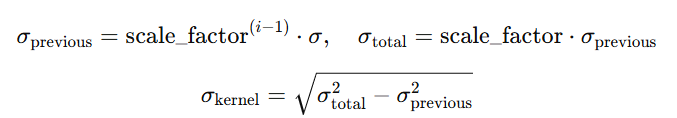

У нас є numIntervals + 1 зображення, які покривають numIntervals кроки від одного значення розмиття до подвоєного. У нас є ще + 2, а саме крок розмиття перед першим зображенням у шарі та ще один крок розмиття після останнього зображення в шарі. Нам потрібні ці два додаткові зображення в кінці, тому що ми будемо віднімати суміжні зображення Гауса, щоб створити піраміду зображень DoG. Це означає, що якщо ми порівнюємо зображення з двох сусідніх шарів, ми побачимо повторення багатьох однакових значень розмиття.

In [ ]:
def generate_gaussian_kernels(sigma, num_intervals):
    num_images_per_octave = num_intervals + 3
    scale_factor = 2 ** (1. / num_intervals)
    kernels = np.zeros(num_images_per_octave)
    kernels[0] = sigma

    for image_index in range(1, num_images_per_octave):
        sigma_previous = (scale_factor ** (image_index - 1)) * sigma
        sigma_total = scale_factor * sigma_previous
        kernels[image_index] = np.sqrt(sigma_total ** 2 - sigma_previous ** 2)
    return kernels

Перше зображення в кожній октаві (крім першої) є результатом зменшення розміру одного з розмитих зображень з попередньої октави.
Потім в межах поточної октави застосовуються нові гаусові розмиття з кроком, який відповідає подвоєному кроку попередньої октави (у масштабі вихідного зображення).

In [ ]:
def generate_gaussian_images(image, num_octaves, gaussian_kernels):
    gaussian_images = []
    for octave_index in range(num_octaves):
        gaussian_images_in_octave = []
        # Перше зображення октави вже має правильне розмиття
        gaussian_images_in_octave.append(image)
        # Послідовно розмиваємо зображення для кожної шкали
        for kernel in gaussian_kernels[1:]:
            image = GaussianBlur(image, (0, 0), sigmaX=kernel, sigmaY=kernel)
            gaussian_images_in_octave.append(image)
        gaussian_images.append(gaussian_images_in_octave)
        # Беремо передостаннє зображення для наступної октави
        octave_base = gaussian_images_in_octave[-3]
        # Зменшуємо розмір у 2 рази для наступної октави
        image = resize(octave_base, (int(octave_base.shape[1] / 2), int(octave_base.shape[0] / 2)), interpolation=INTER_NEAREST)
    return np.array(gaussian_images, dtype=object)

In [ ]:
def generate_dog_images(gaussian_images):
    dog_images = []
    for gaussian_images_in_octave in gaussian_images:
        dog_images_in_octave = []
        # Обчислюємо різницю між послідовними гаусовими зображеннями
        for first_image, second_image in zip(gaussian_images_in_octave, gaussian_images_in_octave[1:]):
            dog_images_in_octave.append(second_image - first_image)
        dog_images.append(dog_images_in_octave)
    return np.array(dog_images, dtype=object)

Октава 1:


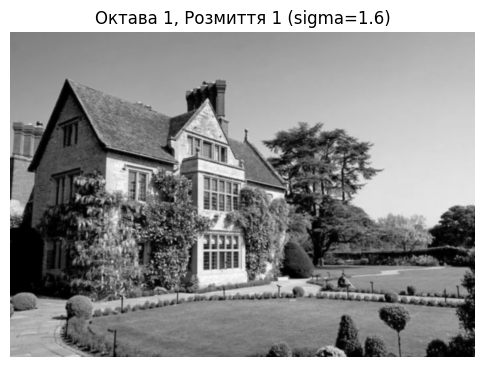

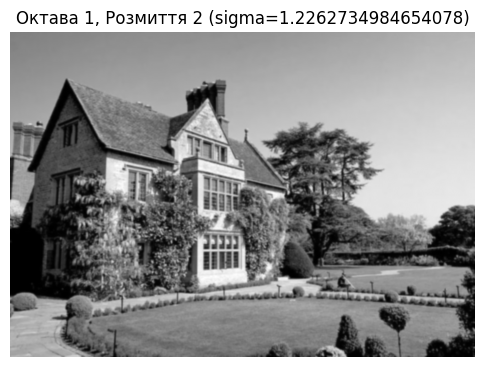

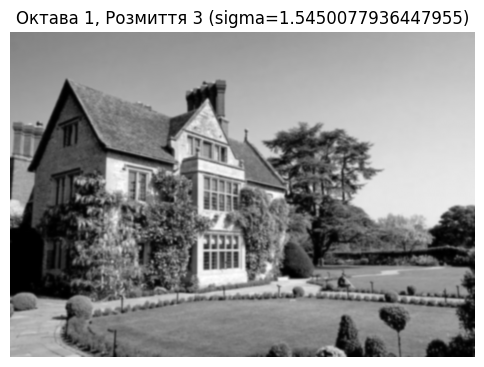

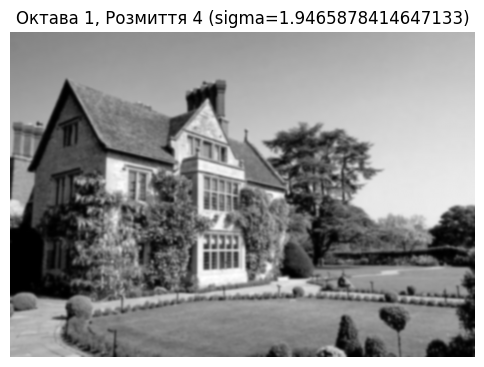

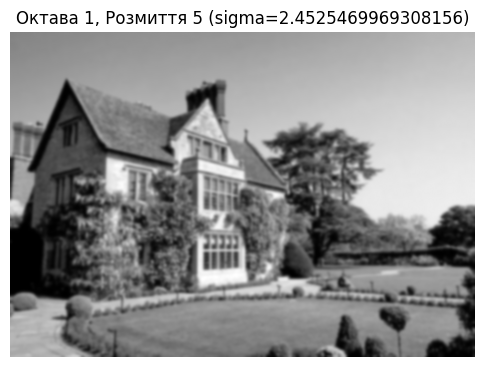

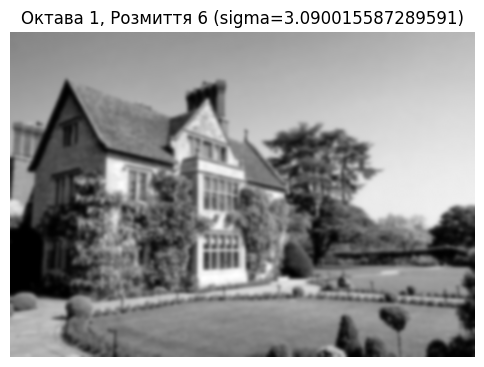

Октава 2:


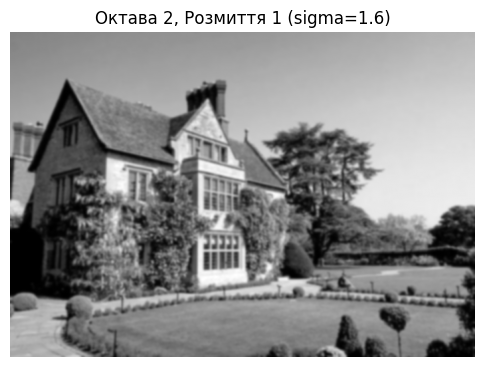

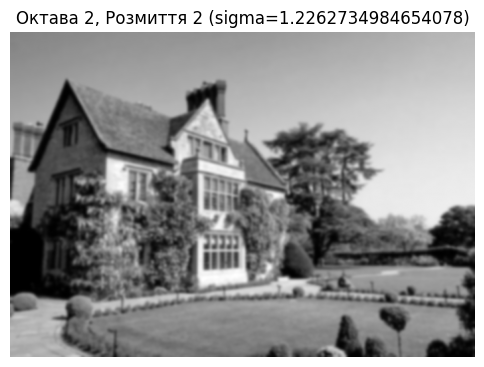

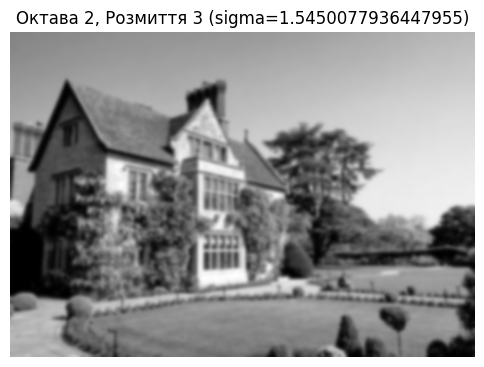

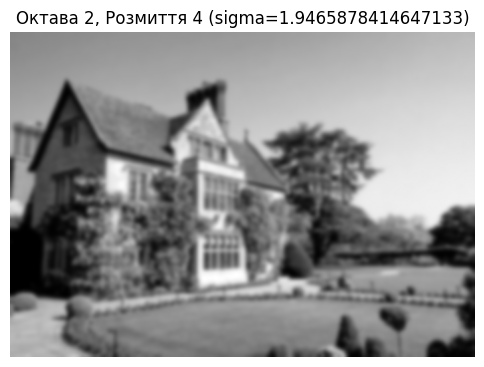

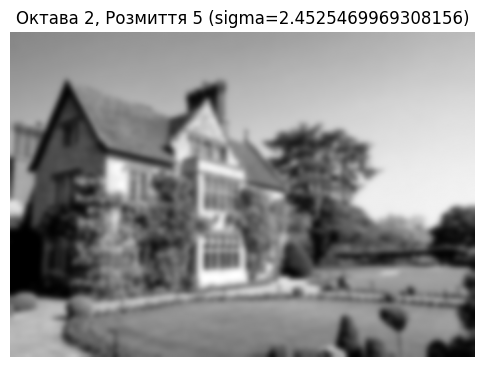

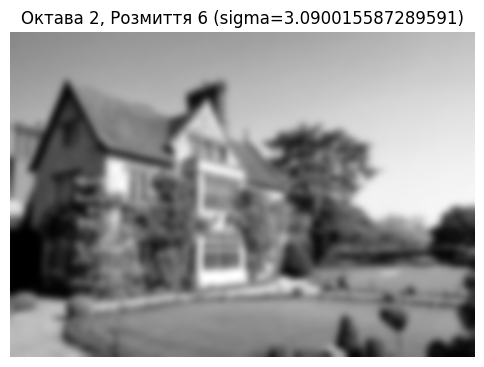

Октава 3:


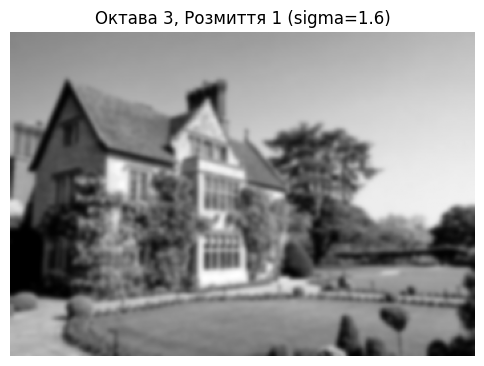

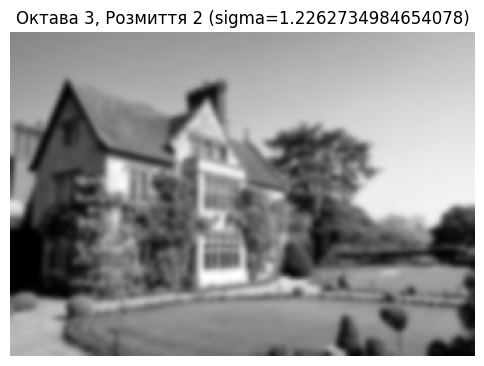

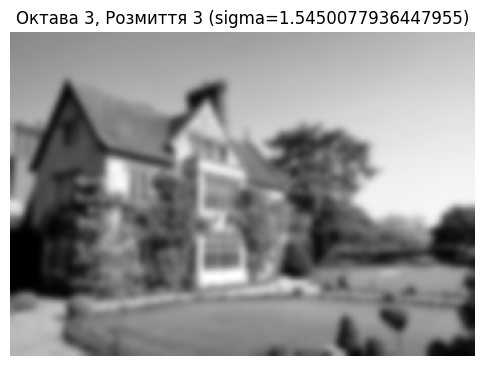

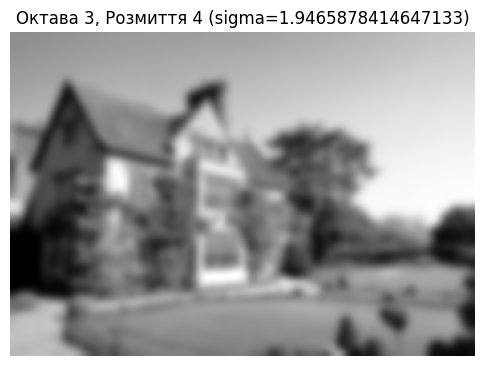

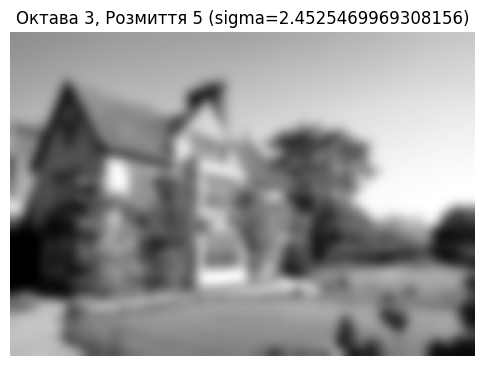

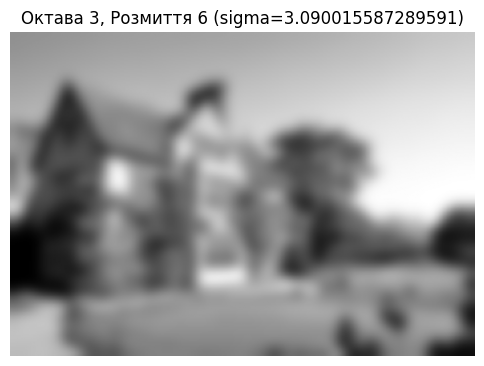

Октава 4:


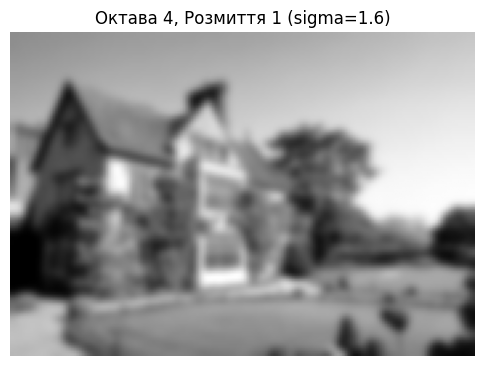

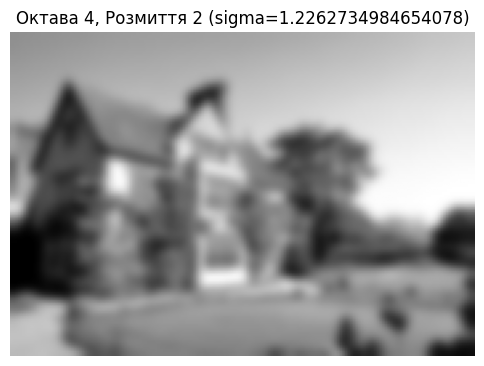

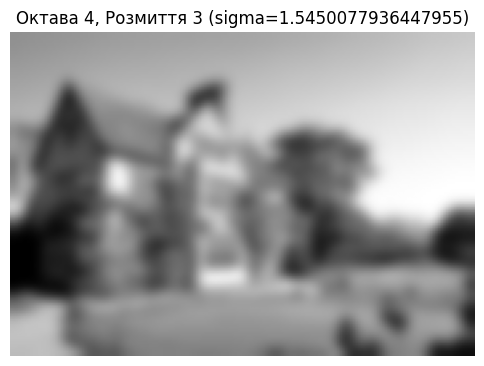

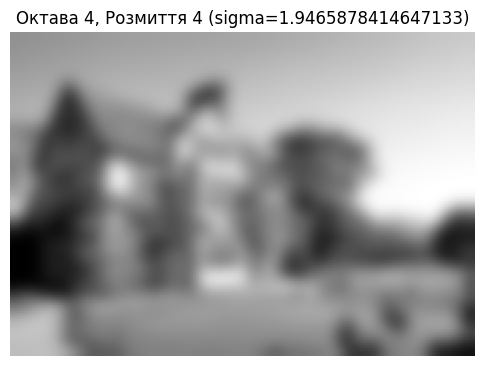

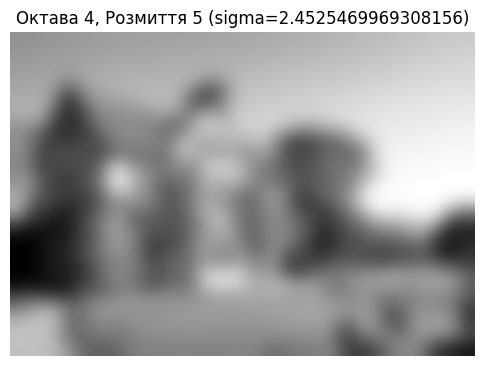

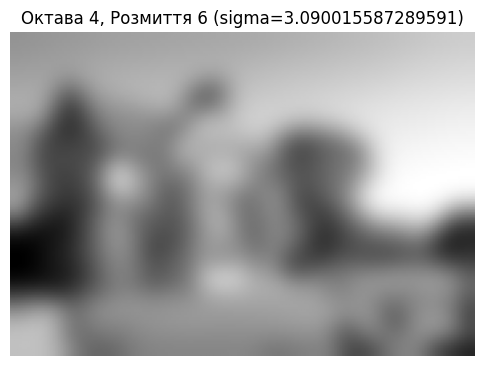

Октава 5:


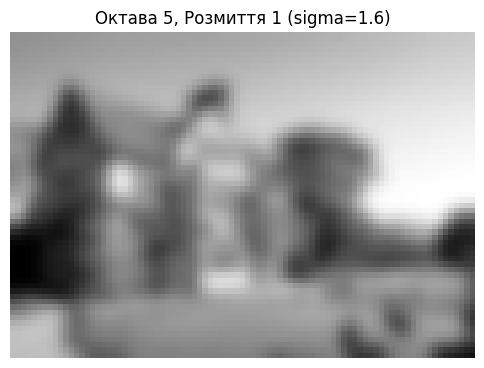

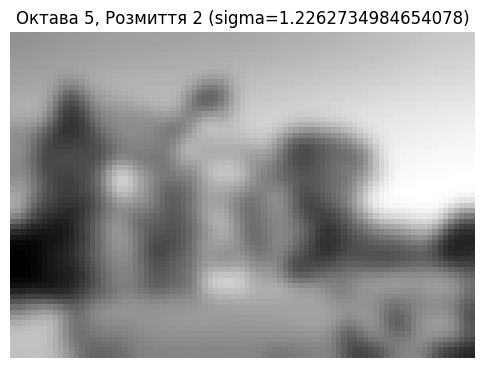

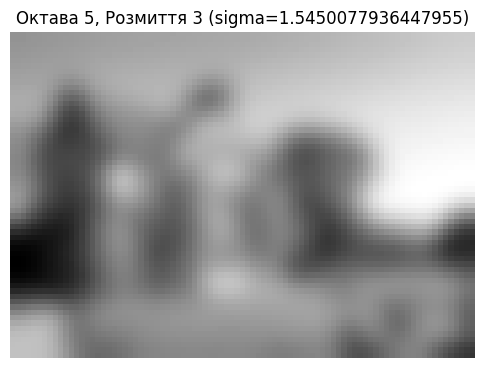

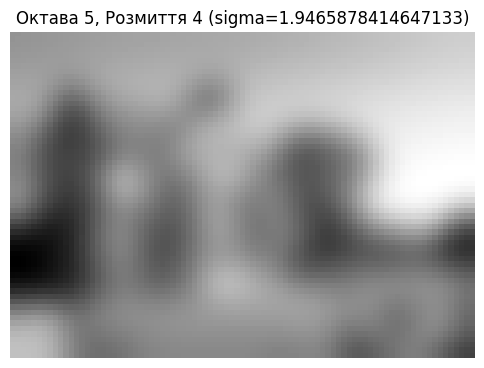

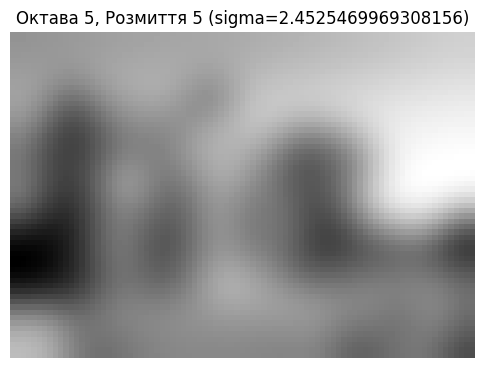

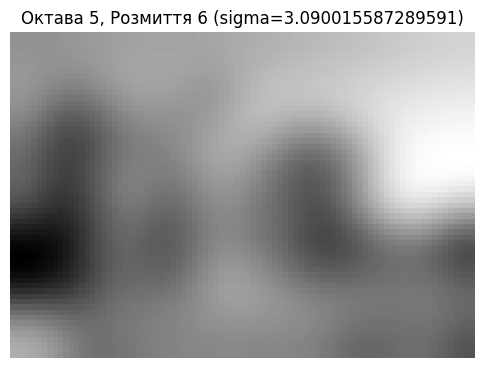

Октава 6:


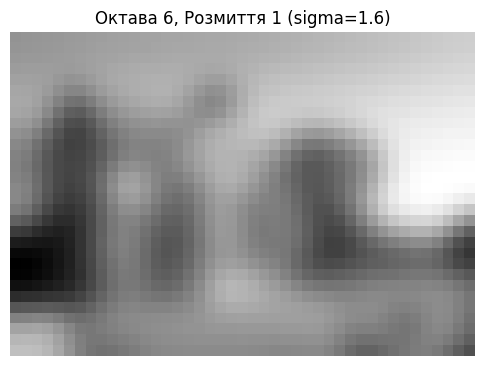

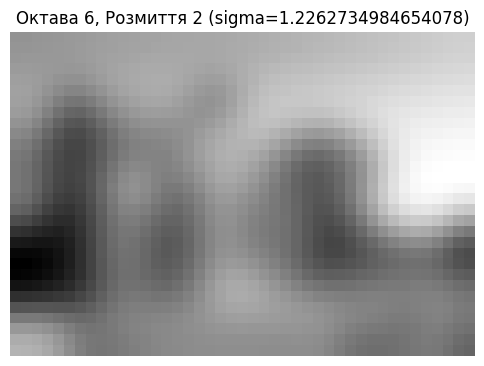

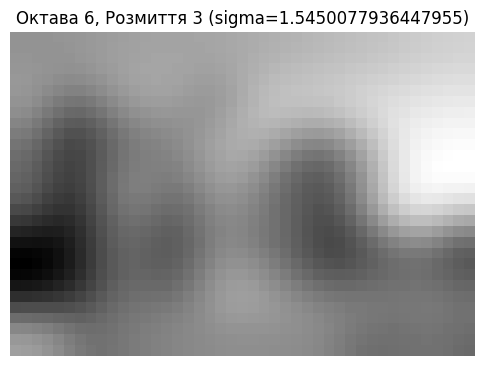

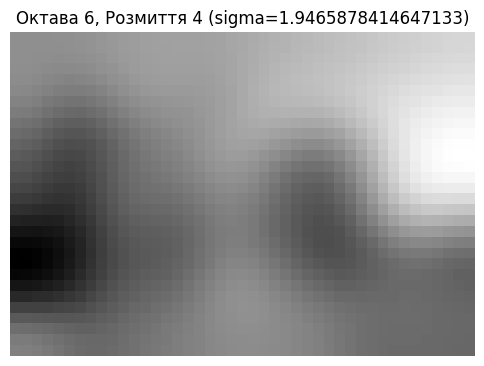

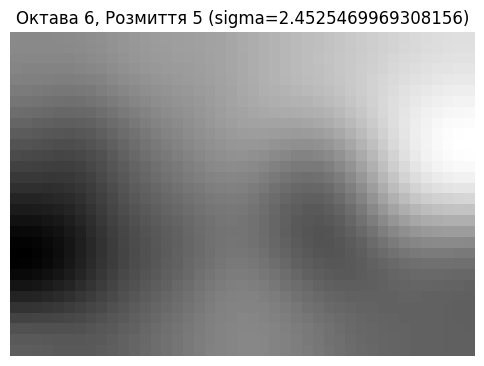

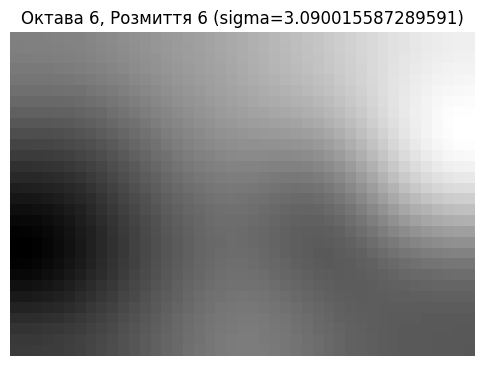

Октава 7:


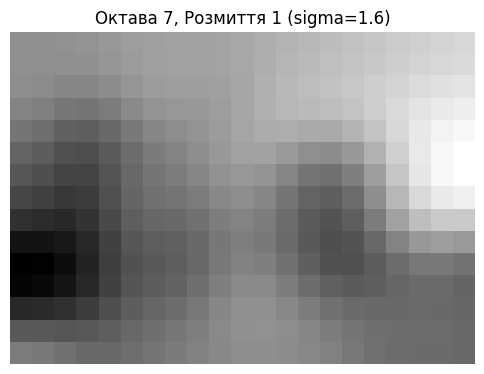

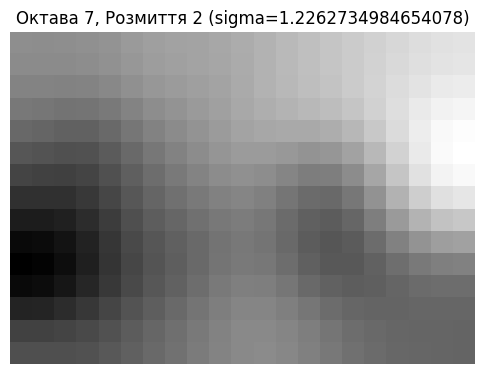

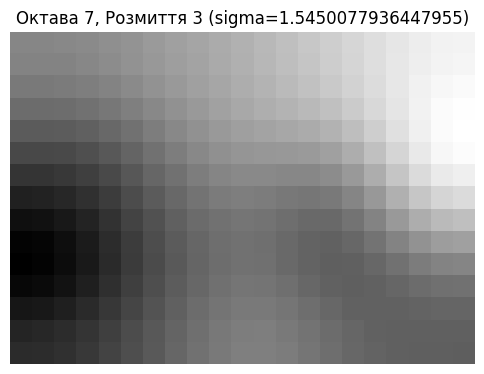

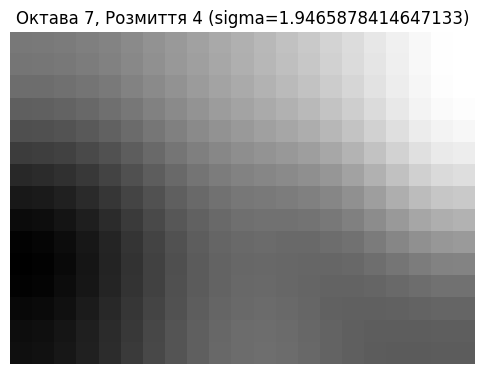

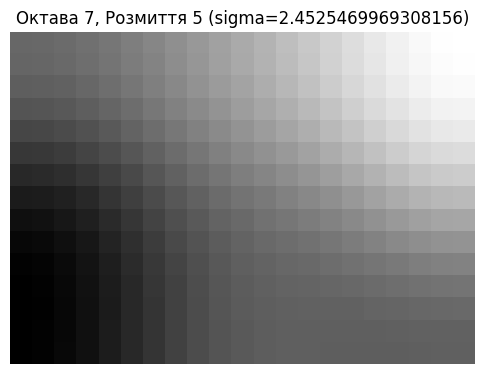

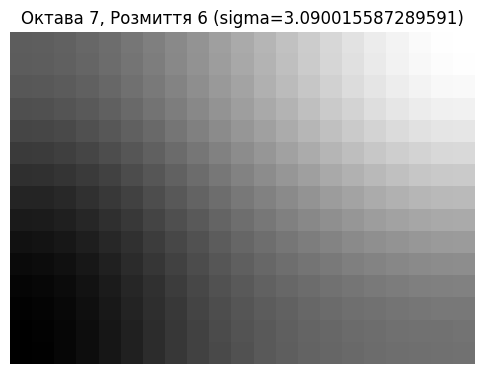

Октава 8:


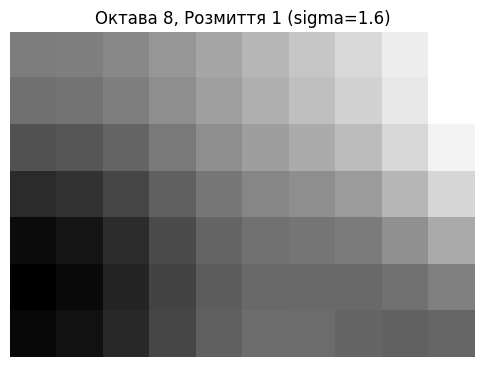

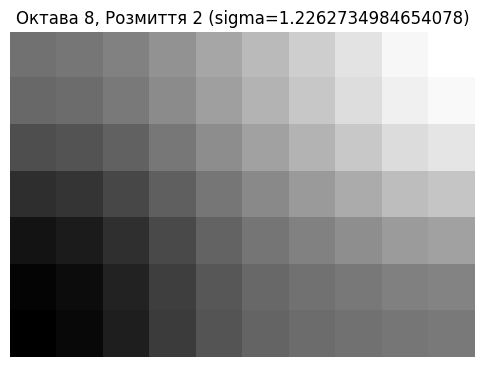

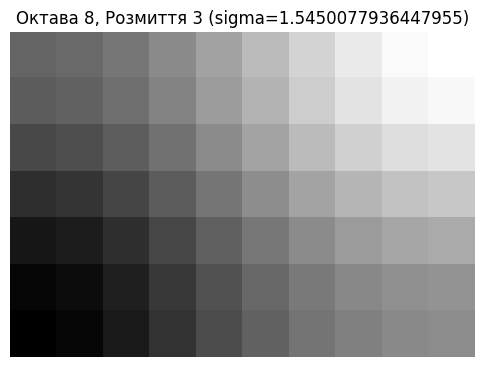

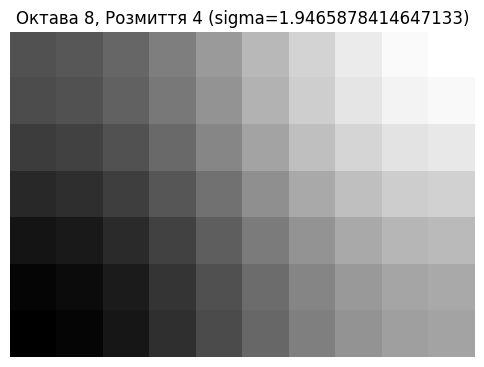

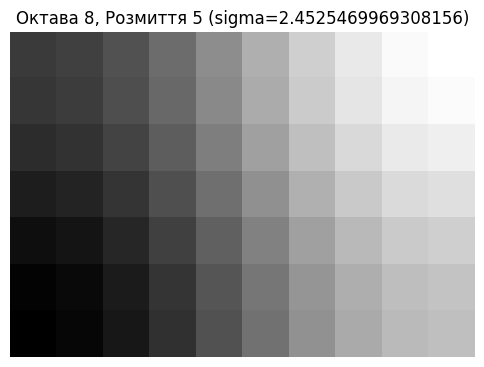

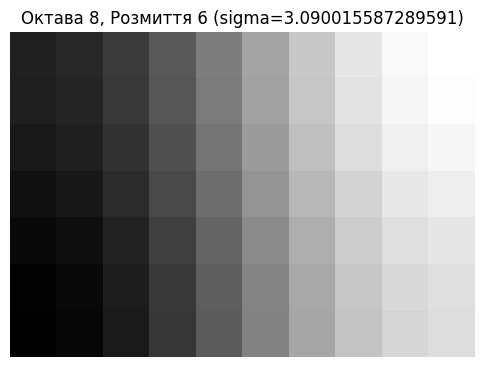

Октава 9:


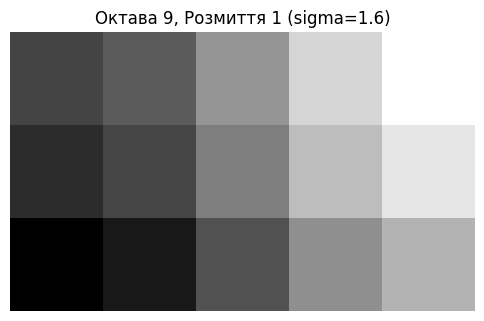

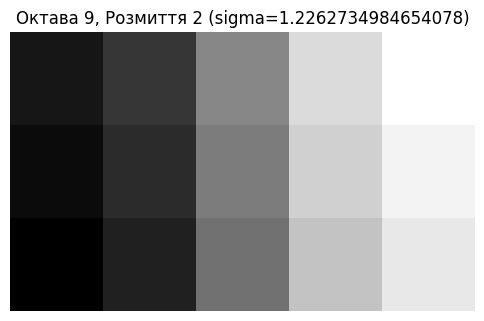

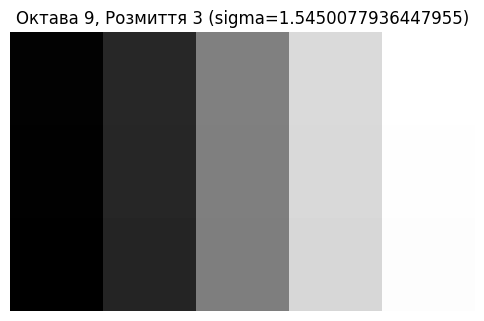

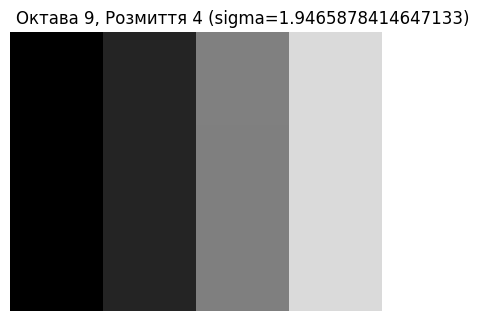

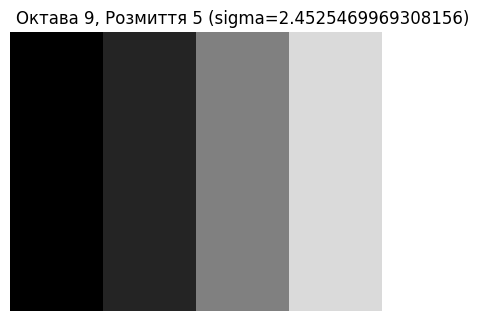

...

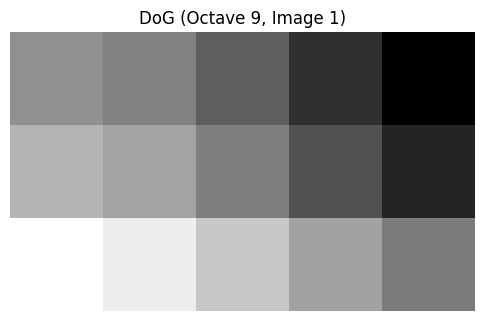

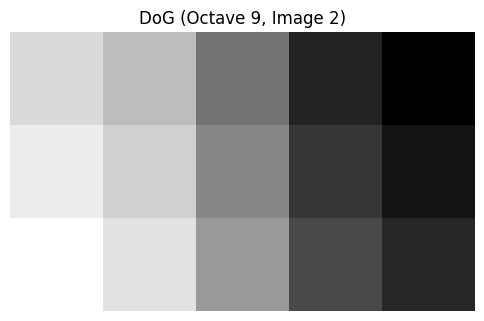

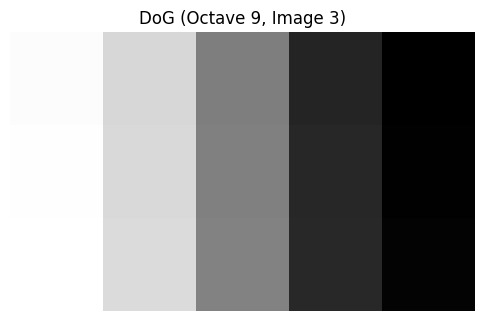

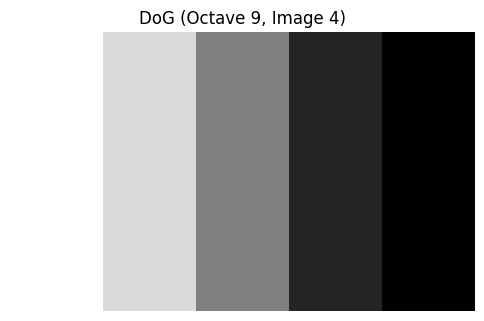

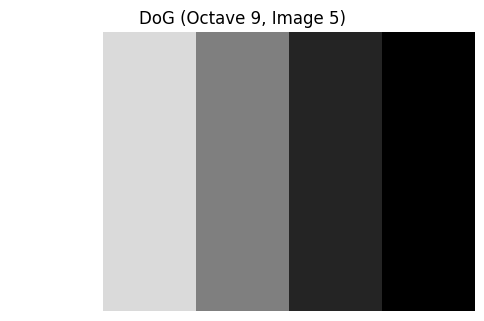

In [ ]:
import matplotlib.pyplot as plt


def compute_keypoints_and_descriptors(image, sigma=1.6, num_intervals=3, assumed_blur=0.5, image_border_width=5):
    base_image = generate_base_image(image, sigma, assumed_blur)
    # Обчислюємо кількість октав на основі розміру базового зображення
    num_octaves = compute_number_of_octaves(base_image.shape)
    # Генеруємо ядра гаусового розмиття для кожної шкали
    gaussian_kernels = generate_gaussian_kernels(sigma, num_intervals)
    # Створюємо піраміду гаусових зображень
    gaussian_images = generate_gaussian_images(base_image, num_octaves, gaussian_kernels)
    for i, octave_images in enumerate(gaussian_images):
        print(f"Октава {i+1}:")
        for j, gaussian_image in enumerate(octave_images):
            plt.figure(figsize=(6, 6))
            plt.imshow(gaussian_image, cmap='gray')
            plt.title(f"Октава {i+1}, Розмиття {j+1} (sigma={gaussian_kernels[j] if j < len(gaussian_kernels) else 'змінюється'})")
            plt.axis('off')
            plt.show()
    dog_images = generate_dog_images(gaussian_images)
    for i, octave_dog_images in enumerate(dog_images):
        for j, dog_image in enumerate(octave_dog_images):
            plt.figure(figsize=(6, 6))
            plt.imshow(dog_image, cmap='gray')
            plt.title(f"DoG (Octave {i+1}, Image {j+1})")
            plt.axis('off')
            plt.show()


compute_keypoints_and_descriptors(cv2.imread("/content/belmond.jpg", cv2.IMREAD_GRAYSCALE))

Перевіряє, чи значення центрального пікселя у кубі 3×3 (на кожному з трьох рівнів) є екстремумом порівняно з усіма 26 сусідніми елементами. Також перевіряється, чи перевищує абсолютне значення цього пікселя певний поріг контрастності.

In [ ]:
def is_pixel_an_extremum(first_subimage, second_subimage, third_subimage, threshold):
    # Значення центрального пікселя
    center_pixel_value = second_subimage[1, 1]
    # Перевіряємо, чи перевищує абсолютне значення поріг
    if abs(center_pixel_value) > threshold:
        if center_pixel_value > 0:
            # Перевіряємо, чи є піксель максимумом серед 26 сусідів
            return (np.all(center_pixel_value >= first_subimage) and
                    np.all(center_pixel_value >= third_subimage) and
                    np.all(center_pixel_value >= second_subimage[0, :]) and
                    np.all(center_pixel_value >= second_subimage[2, :]) and
                    center_pixel_value >= second_subimage[1, 0] and
                    center_pixel_value >= second_subimage[1, 2])
        else:
            # Перевіряємо, чи є піксель мінімумом серед 26 сусідів
            return (np.all(center_pixel_value <= first_subimage) and
                    np.all(center_pixel_value <= third_subimage) and
                    np.all(center_pixel_value <= second_subimage[0, :]) and
                    np.all(center_pixel_value <= second_subimage[2, :]) and
                    center_pixel_value <= second_subimage[1, 0] and
                    center_pixel_value <= second_subimage[1, 2])
    return False

Матриця Гессіана дозволяє аналізувати форму локальної області – якщо точка знаходиться на ребрі, співвідношення власних чисел буде дуже високим, що дозволяє її відсіяти.

In [ ]:
def compute_gradient_at_center_pixel(pixel_array):
    # Центральні різниці другого порядку: (f(x+1) - f(x-1)) / 2
    dx = 0.5 * (pixel_array[1, 1, 2] - pixel_array[1, 1, 0])  # По осі x
    dy = 0.5 * (pixel_array[1, 2, 1] - pixel_array[1, 0, 1])  # По осі y
    ds = 0.5 * (pixel_array[2, 1, 1] - pixel_array[0, 1, 1])  # По осі масштабу
    return np.array([dx, dy, ds])


def compute_hessian_at_center_pixel(pixel_array):
    center = pixel_array[1, 1, 1]
    # Другі похідні: f(x+1) - 2f(x) + f(x-1)
    dxx = pixel_array[1, 1, 2] - 2 * center + pixel_array[1, 1, 0]
    dyy = pixel_array[1, 2, 1] - 2 * center + pixel_array[1, 0, 1]
    dss = pixel_array[2, 1, 1] - 2 * center + pixel_array[0, 1, 1]
    # Змішані похідні: (f(x+1,y+1) - f(x+1,y-1) - f(x-1,y+1) + f(x-1,y-1)) / 4
    dxy = 0.25 * (pixel_array[1, 2, 2] - pixel_array[1, 2, 0] - pixel_array[1, 0, 2] + pixel_array[1, 0, 0])
    dxs = 0.25 * (pixel_array[2, 1, 2] - pixel_array[2, 1, 0] - pixel_array[0, 1, 2] + pixel_array[0, 1, 0])
    dys = 0.25 * (pixel_array[2, 2, 1] - pixel_array[2, 0, 1] - pixel_array[0, 2, 1] + pixel_array[0, 0, 1])
    return np.array([[dxx, dxy, dxs],
                     [dxy, dyy, dys],
                     [dxs, dys, dss]])

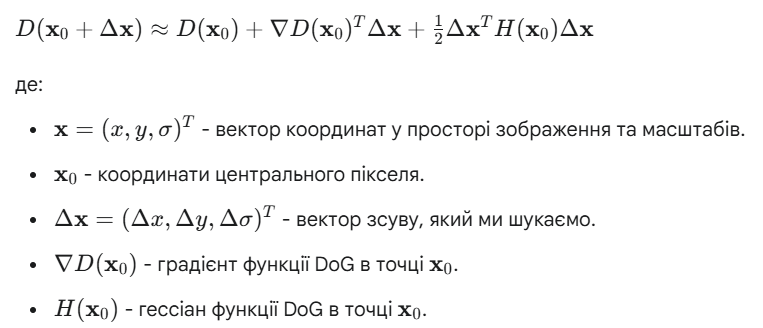

Виявлення характерних ознак: Локальні екстремуми в піраміді DoG відповідають областям зображення, де інтенсивність швидко змінюється на різних масштабах. Ці області часто є кутами, краями та іншими характерними ознаками, які є стійкими до змін масштабу та обертання.

Масштабова інваріантність: Піраміда DoG будується шляхом розмиття та зміни розміру зображення, що дозволяє виявляти ознаки на різних рівнях масштабу. Пошук екстремумів у цій піраміді допомагає знаходити ознаки, які є помітними незалежно від того, на якому масштабі вони спостерігаються.

In [ ]:
def localize_extremum_via_quadratic_fit(row, col, image_index, octave_index, num_intervals, dog_images_in_octave, sigma, image_border_width):
    image_shape = dog_images_in_octave[0].shape
    for attempt in range(NUM_ATTEMPTS_UNTIL_CONVERGENCE):
        # Витягуємо три сусідніх зображення
        first_image, second_image, third_image = dog_images_in_octave[image_index-1:image_index+2]
        # Формуємо куб 3x3x3 навколо пікселя
        pixel_cube = np.stack([first_image[row-1:row+2, col-1:col+2],
                               second_image[row-1:row+2, col-1:col+2],
                               third_image[row-1:row+2, col-1:col+2]]).astype('float32') / 255.
        # Обчислюємо градієнт у центральному пікселі
        gradient = compute_gradient_at_center_pixel(pixel_cube)
        # Обчислюємо гессіан у центральному пікселі
        hessian = compute_hessian_at_center_pixel(pixel_cube)
        # Розв'язуємо систему для уточнення позиції
        #Розв'язавши це рівняння, ми отримуємо вектор, який показує,
        #наскільки і в якому напрямку (включаючи простір зображення та простір масштабів)
        #потрібно змістити початково виявленого кандидата в екстремуми (центральний піксель),
        #щоб отримати його більш точне, субпіксельне та субмасштабне розташування.
        extremum_update = -lstsq(hessian, gradient, rcond=None)[0]
        # Перевіряємо умову сходження (зміщення < 0.5)
        #Якщо так, це означає, що поточна позиція вже досить близька до істинного екстремуму (зміщення менше ніж на півпікселя/півінтервалу масштабу),
        if np.all(np.abs(extremum_update) < 0.5):
            break
        # Оновлюємо координати
        col += int(np.round(extremum_update[0]))
        row += int(np.round(extremum_update[1]))
        image_index += int(np.round(extremum_update[2]))
        # Перевіряємо, чи нова позиція в межах зображення
        if (row < image_border_width or row >= image_shape[0] - image_border_width or
            col < image_border_width or col >= image_shape[1] - image_border_width or
            image_index < 1 or image_index > num_intervals):
            return None
    else:
        return None
    #Обчислює апроксимоване значення функції DoG в уточненій (субпіксельній та субмасштабній) позиції. Це використовується для оцінки "сили" екстремуму.
    function_value = pixel_cube[1, 1, 1] + 0.5 * np.dot(gradient, extremum_update)
    # Ця умова перевіряє, чи є виявлений екстремум достатньо контрастним. Екстремуми з низьким контрастом (близькі до нуля) вважаються нестабільними і відкидаються, оскільки вони можуть бути спричинені шумом або слабкими змінами інтенсивності.
    if abs(function_value) * num_intervals >= CONTRAST_THRESHOLD:
        # Використовуємо співвідношення власних чисел матриці Гессіана для відбракування екстремумів, які лежать на ребрах.
        #Ребра характеризуються великою кривизною в одному напрямку і малою в перпендикулярному.
        #Співвідношення між більшим і меншим власними числами гессіана буде великим для ребер.
        #Умова EIGENVALUE_RATIO * (tr ** 2) < ((EIGENVALUE_RATIO + 1) ** 2) * det_val є способом перевірити, чи це співвідношення не перевищує певного порогового значення (EIGENVALUE_RATIO).
        #Екстремуми, що проходять цю перевірку, вважаються більш схожими на кути або плями. Умова det_val > 0 гарантує, що обидва власні числа мають однаковий знак (локальний максимум або мінімум).
        xy_hessian = hessian[:2, :2]
        tr = np.trace(xy_hessian)
        det_val = det(xy_hessian)
        if det_val > 0 and EIGENVALUE_RATIO * (tr ** 2) < ((EIGENVALUE_RATIO + 1) ** 2) * det_val:
            # Створюємо об'єкт KeyPoint
            keypoint = KeyPoint()
            keypoint.pt = ((col + extremum_update[0]) * (2 ** octave_index),
                           (row + extremum_update[1]) * (2 ** octave_index))
            #Це зсуває закодований субмасштабний зсув на 16 бітів вліво, звільняючи місце для octave_index та image_index.
            #Таким чином, ми використовуємо 8 бітів для кодування субмасштабного зсуву з точністю до 1/255 інтервалу між масштабами.
            keypoint.octave = (octave_index + image_index * (2 ** 8) +
                               int(np.round((extremum_update[2] + 0.5) * 255)) * (2 ** 16))
            keypoint.size = sigma * (2 ** ((image_index + extremum_update[2]) / np.float32(num_intervals))) * (2 ** (octave_index + 1))
            keypoint.response = abs(function_value)
            return keypoint, image_index
    return None

keypoint.pt - встановлює координати ключової точки у вихідному зображенні шляхом додавання субпіксельного зсуву (extremum_update[0], extremum_update[1]) до початкових координат (col, row) і масштабування їх відповідно до номера октави (2 ** octave_index).
keypoint.octave - кодує інформацію про октаву та рівень масштабу, на якому було знайдено ключову точку.
keypoint.size - встановлює характеристичний розмір (масштаб) ключової точки, використовуючи початкове значення сигма (sigma), індекс масштабу (image_index) та субмасштабний зсув (extremum_update[2]), а також масштабний коефіцієнт для поточної октави.
keypoint.response - встановлює силу (значення функції DoG) ключової точки, що може використовуватися для ранжування ключових точок.
Функція повертає створений об'єкт keypoint та оновлений image_index (який може бути змінений в процесі уточнення).

In [ ]:
def compute_keypoints_with_orientations(keypoint, octave_index, gaussian_image):
    keypoints_with_orientations = []
    image_shape = gaussian_image.shape
    # Обчислюємо масштаб для регіону навколо точки
    scale = ORIENTATION_SCALE_FACTOR * keypoint.size / np.float32(2 ** (octave_index + 1))
    radius = int(np.round(ORIENTATION_RADIUS_FACTOR * scale))
    weight_factor = -0.5 / (scale ** 2)
    # Ініціалізуємо гістограми
    raw_histogram = np.zeros(ORIENTATION_NUM_BINS)
    smooth_histogram = np.zeros(ORIENTATION_NUM_BINS)
    # Проходимо по регіону навколо точки
    for i in range(-radius, radius + 1):
        region_y = int(np.round(keypoint.pt[1] / np.float32(2 ** octave_index))) + i
        if 0 < region_y < image_shape[0] - 1:
            for j in range(-radius, radius + 1):
                region_x = int(np.round(keypoint.pt[0] / np.float32(2 ** octave_index))) + j
                if 0 < region_x < image_shape[1] - 1:
                    # Обчислюємо градієнти
                    dx = gaussian_image[region_y, region_x + 1] - gaussian_image[region_y, region_x - 1]
                    dy = gaussian_image[region_y - 1, region_x] - gaussian_image[region_y + 1, region_x]
                    magnitude = np.sqrt(dx * dx + dy * dy)
                    orientation = np.rad2deg(np.arctan2(dy, dx))
                    # Ваговий коефіцієнт за гаусовим розподілом
                    weight = np.exp(weight_factor * (i ** 2 + j ** 2))
                    hist_index = int(np.round(orientation * ORIENTATION_NUM_BINS / 360.)) % ORIENTATION_NUM_BINS
                    raw_histogram[hist_index] += weight * magnitude
    # Згладжуємо гістограму
    for n in range(ORIENTATION_NUM_BINS):
        smooth_histogram[n] = (6 * raw_histogram[n] +
                               4 * (raw_histogram[n - 1] + raw_histogram[(n + 1) % ORIENTATION_NUM_BINS]) +
                               raw_histogram[n - 2] + raw_histogram[(n + 2) % ORIENTATION_NUM_BINS]) / 16.
    # Знаходимо піки гістограми
    max_peak = max(smooth_histogram)
    peaks = np.where(np.logical_and(smooth_histogram > np.roll(smooth_histogram, 1),
                                    smooth_histogram > np.roll(smooth_histogram, -1)))[0]
    for peak_index in peaks:
        peak_value = smooth_histogram[peak_index]
        if peak_value >= ORIENTATION_PEAK_RATIO * max_peak:
            # Інтерполюємо пік квадратичною апроксимацією
            left = smooth_histogram[(peak_index - 1) % ORIENTATION_NUM_BINS]
            right = smooth_histogram[(peak_index + 1) % ORIENTATION_NUM_BINS]
            interp_peak = (peak_index + 0.5 * (left - right) / (left - 2 * peak_value + right)) % ORIENTATION_NUM_BINS
            #SIFT досягає інваріантності до повороту завдяки тому, що на етапі обчислення ключових точок для кожної точки визначається її домінантна орієнтація.
            orientation = 360. - interp_peak * 360. / ORIENTATION_NUM_BINS
            if abs(orientation - 360.) < FLOAT_TOLERANCE:
                orientation = 0
            # Створюємо нову ключову точку з орієнтацією
            new_keypoint = KeyPoint(*keypoint.pt, keypoint.size, orientation, keypoint.response, keypoint.octave)
            keypoints_with_orientations.append(new_keypoint)
    return keypoints_with_orientations

In [ ]:
def find_scale_space_extrema(gaussian_images, dog_images, num_intervals, sigma, image_border_width):
    # Поріг контрастності для відбору кандидатів (з OpenCV)
    threshold = np.floor(0.5 * CONTRAST_THRESHOLD / num_intervals * 255)
    keypoints = []

    for octave_index, dog_images_in_octave in enumerate(dog_images):
        # Проходимо по кожному набору з трьох зображень у октаві
        for image_index in range(1, len(dog_images_in_octave) - 1):
            first_image = dog_images_in_octave[image_index - 1]
            second_image = dog_images_in_octave[image_index]
            third_image = dog_images_in_octave[image_index + 1]
            # Проходимо по пікселях, уникаючи меж
            for row in range(image_border_width, first_image.shape[0] - image_border_width):
                for col in range(image_border_width, first_image.shape[1] - image_border_width):
                    # Перевіряємо, чи є піксель екстремумом
                    if is_pixel_an_extremum(first_image[row-1:row+2, col-1:col+2],
                                           second_image[row-1:row+2, col-1:col+2],
                                           third_image[row-1:row+2, col-1:col+2],
                                           threshold):
                        # Локалізуємо екстремум за допомогою квадратичної апроксимації
                        result = localize_extremum_via_quadratic_fit(row, col, image_index, octave_index,
                                                                     num_intervals, dog_images_in_octave,
                                                                     sigma, image_border_width)
                        if result is not None:
                            keypoint, localized_image_index = result
                            # Обчислюємо орієнтації для ключової точки
                            keypoints_with_orientations = compute_keypoints_with_orientations(
                                keypoint, octave_index, gaussian_images[octave_index][localized_image_index])
                            keypoints.extend(keypoints_with_orientations)
    return keypoints

In [ ]:
def compare_keypoints(keypoint1, keypoint2):
    if keypoint1.pt[0] != keypoint2.pt[0]:
        return keypoint1.pt[0] - keypoint2.pt[0]
    if keypoint1.pt[1] != keypoint2.pt[1]:
        return keypoint1.pt[1] - keypoint2.pt[1]
    if keypoint1.size != keypoint2.size:
        return keypoint2.size - keypoint1.size
    if keypoint1.angle != keypoint2.angle:
        return keypoint1.angle - keypoint2.angle
    if keypoint1.response != keypoint2.response:
        return keypoint2.response - keypoint1.response
    if keypoint1.octave != keypoint2.octave:
        return keypoint2.octave - keypoint1.octave
    return keypoint2.class_id - keypoint1.class_id


def remove_duplicate_keypoints(keypoints):
    if len(keypoints) < 2:
        return keypoints
    # Сортуємо ключові точки
    keypoints.sort(key=cmp_to_key(compare_keypoints))
    unique_keypoints = [keypoints[0]]
    # Фільтруємо дублікати
    for next_keypoint in keypoints[1:]:
        last = unique_keypoints[-1]
        if (last.pt[0] != next_keypoint.pt[0] or
            last.pt[1] != next_keypoint.pt[1] or
            last.size != next_keypoint.size or
            last.angle != next_keypoint.angle):
            unique_keypoints.append(next_keypoint)
    return unique_keypoints

Витягує інформацію про октаву, рівень (layer) та обчислює масштабний коефіцієнт, використовуючи бітові операції з властивістю octave.

In [ ]:
def convert_keypoints_to_input_image_size(keypoints):
    converted_keypoints = []
    for keypoint in keypoints:
        # Ділимо координати та розмір на 2 через початкове збільшення
        keypoint.pt = tuple(0.5 * np.array(keypoint.pt))
        keypoint.size *= 0.5
        # Зменшуємо індекс октави на 1
        keypoint.octave = (keypoint.octave & ~255) | ((keypoint.octave - 1) & 255)
        converted_keypoints.append(keypoint)
    return converted_keypoints


def unpack_octave(keypoint):
    octave = keypoint.octave & 255
    layer = (keypoint.octave >> 8) & 255
    if octave >= 128:
        octave |= -128
    scale = 1 / np.float32(1 << octave) if octave >= 0 else np.float32(1 << -octave)
    return octave, layer, scale

- **Обертання області:**  
  Область навколо ключової точки обертається за допомогою стандартної матриці повороту:
  \[
  \begin{pmatrix}
  x' \\ y'
  \end{pmatrix} =
  \begin{pmatrix}
  \cos\theta & -\sin\theta \\
  \sin\theta & \cos\theta
  \end{pmatrix}
  \begin{pmatrix}
  x \\ y
  \end{pmatrix}
  \]
  де \(\theta\) – орієнтація ключової точки.
- **Розбиття на блоки:**  
  Область розбивається на блоки розміром **4×4**. Для кожного блоку формується гістограма з 8 бінів, що відповідають різним орієнтаціям.
- **Трилінійна інтерполяція:**  
  Значення градієнтів пікселів розподіляються між суміжними просторовими та орієнтаційними біновими комірками залежно від їх відносних позицій.
- **Нормалізація та обрізання:**  
  Отриманий вектор дескриптора нормалізується для досягнення інваріантності до змін освітлення. Потім значення обрізаються за пороговим значенням (DESCRIPTOR_MAX_VALUE) і повторно нормалізуються, після чого масштабується до діапазону [0, 255].

- **Обертання:**  
  Забезпечує, що дескриптор описує локальну область у канонічному положенні, що робить його інваріантним до поворотів.
- **Розбиття на гістограми:**  
  Інтегрує локальні градієнти в компактний вектор, стійкий до незначних змін і шуму.
- **Трилінійна інтерполяція:**  
  Зменшує ефект дискретизації, розподіляючи внесок кожного пікселя між сусідніми біновими комірками для підвищення точності.
- **Нормалізація:**  
  Робить дескриптор менш чутливим до змін яскравості та контрасту, покращуючи його стабільність при зіставленні.

- Фінальний вектор дескриптора представляє локальний розподіл градієнтів навколо ключової точки, що дозволяє ефективно порівнювати ключові точки між різними зображеннями навіть за умов змін масштабу, повороту чи освітлення.


In [ ]:
def generate_descriptors(keypoints, gaussian_images):
    descriptors = []
    for keypoint in keypoints:
        # Отримуємо октаву, рівень і масштаб
        octave, layer, scale = unpack_octave(keypoint)
        gaussian_image = gaussian_images[octave + 1][layer]
        num_rows, num_cols = gaussian_image.shape
        point = np.round(scale * np.array(keypoint.pt)).astype('int')
        angle = 360. - keypoint.angle
        cos_a = np.cos(np.deg2rad(angle))
        sin_a = np.sin(np.deg2rad(angle))
        # Ініціалізуємо списки для трилінійної інтерполяції
        row_bins = []
        col_bins = []
        magnitudes = []
        orientation_bins = []
        # Створюємо тензор гістограм із запасом для меж
        histogram_tensor = np.zeros((DESCRIPTOR_WINDOW_WIDTH + 2, DESCRIPTOR_WINDOW_WIDTH + 2, DESCRIPTOR_NUM_BINS))
        # Обчислюємо розмір вікна дескриптора
        hist_width = DESCRIPTOR_SCALE_MULTIPLIER * 0.5 * scale * keypoint.size
        half_width = int(np.round(hist_width * np.sqrt(2) * (DESCRIPTOR_WINDOW_WIDTH + 1) * 0.5))
        half_width = min(half_width, int(np.sqrt(num_rows ** 2 + num_cols ** 2)))
        weight_multiplier = -0.5 / ((0.5 * DESCRIPTOR_WINDOW_WIDTH) ** 2)
        bins_per_degree = DESCRIPTOR_NUM_BINS / 360.
        # Проходимо по регіону навколо точки
        for row in range(-half_width, half_width + 1):
            for col in range(-half_width, half_width + 1):
                # Обертаємо координати відповідно до орієнтації
                row_rot = col * sin_a + row * cos_a
                col_rot = col * cos_a - row * sin_a
                row_bin = (row_rot / hist_width) + 0.5 * DESCRIPTOR_WINDOW_WIDTH - 0.5
                col_bin = (col_rot / hist_width) + 0.5 * DESCRIPTOR_WINDOW_WIDTH - 0.5
                if (-1 < row_bin < DESCRIPTOR_WINDOW_WIDTH and
                    -1 < col_bin < DESCRIPTOR_WINDOW_WIDTH):
                    window_row = int(np.round(point[1] + row))
                    window_col = int(np.round(point[0] + col))
                    if (0 < window_row < num_rows - 1 and
                        0 < window_col < num_cols - 1):
                        # Обчислюємо градієнт
                        dx = gaussian_image[window_row, window_col + 1] - gaussian_image[window_row, window_col - 1]
                        dy = gaussian_image[window_row - 1, window_col] - gaussian_image[window_row + 1, window_col]
                        magnitude = np.sqrt(dx * dx + dy * dy)
                        orientation = np.rad2deg(np.arctan2(dy, dx)) % 360
                        weight = np.exp(weight_multiplier * ((row_rot / hist_width) ** 2 + (col_rot / hist_width) ** 2))
                        # Додаємо до списків для інтерполяції
                        row_bins.append(row_bin)
                        col_bins.append(col_bin)
                        magnitudes.append(weight * magnitude)
                        orientation_bins.append((orientation - angle) * bins_per_degree)
        # Виконуємо трилінійну інтерполяцію
        for r_bin, c_bin, mag, o_bin in zip(row_bins, col_bins, magnitudes, orientation_bins):
            r_floor, c_floor, o_floor = np.floor([r_bin, c_bin, o_bin]).astype(int)
            r_frac, c_frac, o_frac = r_bin - r_floor, c_bin - c_floor, o_bin - o_floor
            o_floor = o_floor % DESCRIPTOR_NUM_BINS
            c0 = mag * (1 - r_frac)
            c1 = mag * r_frac
            c00 = c0 * (1 - c_frac)
            c01 = c0 * c_frac
            c10 = c1 * (1 - c_frac)
            c11 = c1 * c_frac
            c000 = c00 * (1 - o_frac)
            c001 = c00 * o_frac
            c010 = c01 * (1 - o_frac)
            c011 = c01 * o_frac
            c100 = c10 * (1 - o_frac)
            c101 = c10 * o_frac
            c110 = c11 * (1 - o_frac)
            c111 = c11 * o_frac
            # Оновлюємо гістограми
            histogram_tensor[r_floor + 1, c_floor + 1, o_floor] += c000
            histogram_tensor[r_floor + 1, c_floor + 1, (o_floor + 1) % DESCRIPTOR_NUM_BINS] += c001
            histogram_tensor[r_floor + 1, c_floor + 2, o_floor] += c010
            histogram_tensor[r_floor + 1, c_floor + 2, (o_floor + 1) % DESCRIPTOR_NUM_BINS] += c011
            histogram_tensor[r_floor + 2, c_floor + 1, o_floor] += c100
            histogram_tensor[r_floor + 2, c_floor + 1, (o_floor + 1) % DESCRIPTOR_NUM_BINS] += c101
            histogram_tensor[r_floor + 2, c_floor + 2, o_floor] += c110
            histogram_tensor[r_floor + 2, c_floor + 2, (o_floor + 1) % DESCRIPTOR_NUM_BINS] += c111
        # Формуємо вектор дескриптора, видаляючи межі
        descriptor_vector = histogram_tensor[1:-1, 1:-1, :].flatten()
        # Нормалізуємо та обрізаємо
        thresh = norm(descriptor_vector) * DESCRIPTOR_MAX_VALUE
        descriptor_vector[descriptor_vector > thresh] = thresh
        descriptor_vector /= max(norm(descriptor_vector), FLOAT_TOLERANCE)
        # Перетворюємо в діапазон [0, 255]
        descriptor_vector = np.round(512 * descriptor_vector)
        descriptor_vector[descriptor_vector < 0] = 0
        descriptor_vector[descriptor_vector > 255] = 255
        descriptors.append(descriptor_vector)
    return np.array(descriptors, dtype='float32')

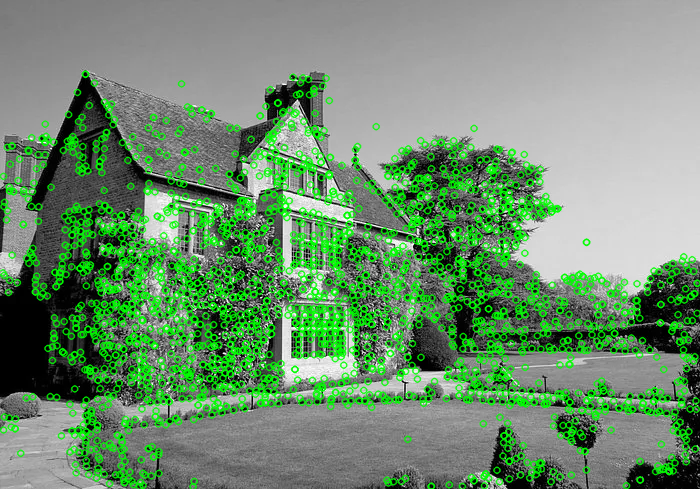

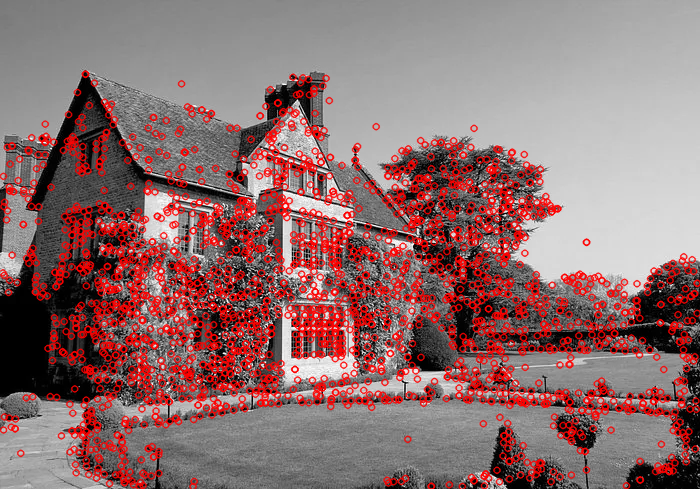

In [ ]:
oriented_keypoints, my_descriptors = compute_keypoints_and_descriptors(cv2.imread("/content/belmond.jpg", cv2.IMREAD_GRAYSCALE))

img = cv2.imread("/content/belmond.jpg", cv2.IMREAD_GRAYSCALE)
sift_cv2 = cv2.SIFT_create()
kp_cv2, des_cv2 = sift_cv2.detectAndCompute(img, None)

img_my = cv2.drawKeypoints(img, oriented_keypoints, None, color=(0, 255, 0))
img_cv2 = cv2.drawKeypoints(img, kp_cv2, None, color=(0, 0, 255))

cv2_imshow(img_my)
cv2_imshow(img_cv2)

Оригінальне зображення: знайдено 2549 ключових точок
Спотворене зображення: знайдено 3150 ключових точок
Кількість співпадінь (власна функція): 637
Кількість співпадінь (KNN Matcher): 1616


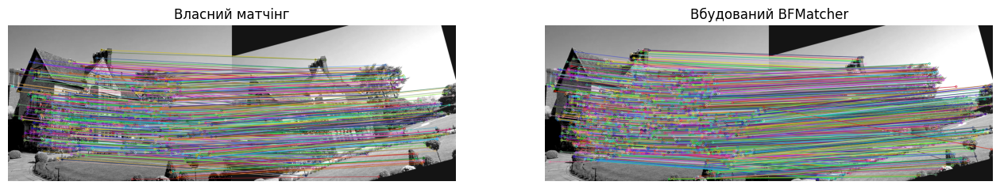

Оригінальне зображення: знайдено 7495 ключових точок
Спотворене зображення: знайдено 9029 ключових точок
Кількість співпадінь (власна функція): 2366
Кількість співпадінь (KNN Matcher): 4874


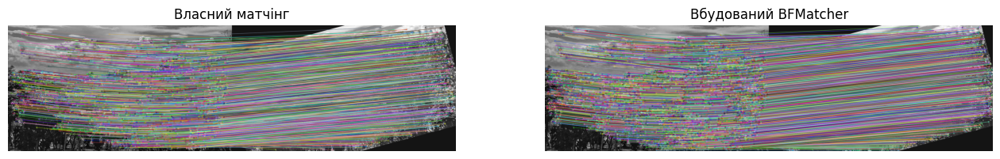

Оригінальне зображення: знайдено 5057 ключових точок
Спотворене зображення: знайдено 6997 ключових точок
Кількість співпадінь (власна функція): 2163
Кількість співпадінь (KNN Matcher): 3865


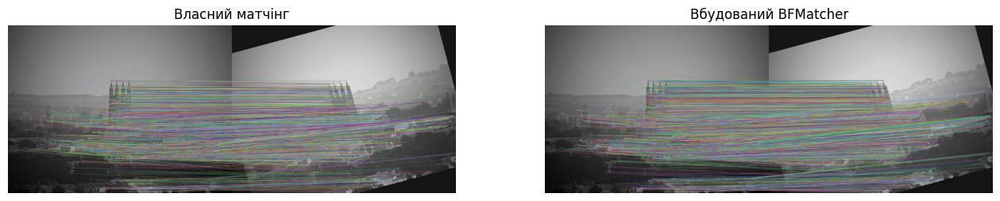

Оригінальне зображення: знайдено 113 ключових точок
Спотворене зображення: знайдено 164 ключових точок
Кількість співпадінь (власна функція): 60
Кількість співпадінь (KNN Matcher): 56


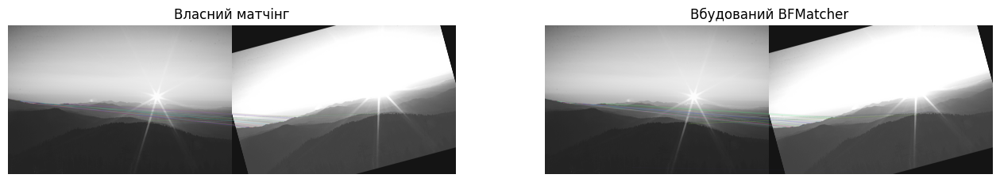

In [ ]:
import cv2
import numpy as np
import random
import math
import matplotlib.pyplot as plt


def distort_image(image: np.ndarray) -> np.ndarray:
    rows, cols = image.shape[:2]
    # Визначаємо кут повороту
    angle = 15
    # Обчислюємо матрицю повороту
    M_rot = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1.0)
    # Додаємо зсув по x та y
    M_rot[0, 2] += 10
    M_rot[1, 2] += 10
    # Застосовуємо аффінне перетворення
    distorted = cv2.warpAffine(image, M_rot, (cols, rows))

    # Зміна яскравості та контрастності
    alpha = 1.2  # коефіцієнт контрастності
    beta = 20    # коефіцієнт яскравості
    distorted = cv2.convertScaleAbs(distorted, alpha=alpha, beta=beta)

    return distorted


def compute_sift_features(image: np.ndarray):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image

    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return keypoints, descriptors


def match_descriptors(descriptors1: np.ndarray, descriptors2: np.ndarray):
    matches = []

    for i, desc1 in enumerate(descriptors1):
        best_dist = float('inf')
        best_idx = -1

        for j, desc2 in enumerate(descriptors2):
            dist = np.linalg.norm(desc1 - desc2)

            if dist < best_dist:
                best_dist = dist
                best_idx = j

        if best_idx != -1:
                if best_dist < 60:
                    matches.append(cv2.DMatch(i, best_idx, best_dist))
    return matches


if __name__ == '__main__':
    for image_path in ['/content/belmond.jpg',
                       '/content/high_cont.jpg',
                       '/content/low_cont.jpg',
                       '/content/sun.jpg']:
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if image is None:
            raise ValueError("Не вдалося завантажити зображення. Перевірте шлях.")

        distorted_image = distort_image(image)

        kp1, des1 = compute_sift_features(image)
        kp2, des2 = compute_sift_features(distorted_image)

        print(f"Оригінальне зображення: знайдено {len(kp1)} ключових точок")
        print(f"Спотворене зображення: знайдено {len(kp2)} ключових точок")

        my_matches = match_descriptors(des1, des2)
        print(f"Кількість співпадінь (власна функція): {len(my_matches)}")

        bf = cv2.BFMatcher()
        cv_matches = bf.knnMatch(des1, des2, k=2)
        cv_good_matches = []
        for m, n in cv_matches:
            #Тест Лоу (Lowe’s ratio test)
            #Перевіряється, чи відстань (міра різниці) для найкращого збігу m значно менша за відстань другого збігу n.
            #Якщо m.distance менше, ніж 75% від n.distance, то такий збіг вважається надійним.
            if m.distance < 0.75 * n.distance:
                cv_good_matches.append(m)

        print(f"Кількість співпадінь (KNN Matcher): {len(cv_good_matches)}")

        img_custom_matches = cv2.drawMatches(
            image, kp1, distorted_image, kp2,
            my_matches,
            None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
        )

        img_builtin_matches = cv2.drawMatches(
            image, kp1, distorted_image, kp2,
            cv_good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
        )

        plt.figure(figsize=(16, 8))

        plt.subplot(1, 2, 1)
        plt.imshow(img_custom_matches, cmap='gray')
        plt.title("Власний матчінг")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(img_builtin_matches, cmap='gray')
        plt.title("Вбудований BFMatcher")
        plt.axis("off")

        plt.show()

В процесі порівняння дескрипторів використати власну реалізацію
алгоритму RANSAC. Також враховується факт написання власної функції
побудови дескрипторів, без використання OpenCV.

In [ ]:
import cv2
import numpy as np
import random
import matplotlib.pyplot as plt


def distort_image(image: np.ndarray) -> np.ndarray:
    rows, cols = image.shape[:2]
    angle = 15
    M_rot = cv2.getRotationMatrix2D((cols/2, rows/2), angle, 1.0)
    M_rot[0, 2] += 10
    M_rot[1, 2] += 10
    distorted = cv2.warpAffine(image, M_rot, (cols, rows))
    alpha = 1.2
    beta = 20
    distorted = cv2.convertScaleAbs(distorted, alpha=alpha, beta=beta)
    return distorted


def compute_sift_features(image: np.ndarray):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    sift = cv2.SIFT_create()
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return keypoints, descriptors


def match_descriptors(descriptors1: np.ndarray, descriptors2: np.ndarray):
    matches = []

    for i, desc1 in enumerate(descriptors1):
        best_dist = float('inf')
        best_idx = -1

        for j, desc2 in enumerate(descriptors2):
            dist = np.linalg.norm(desc1 - desc2)

            if dist < best_dist:
                best_dist = dist
                best_idx = j

        if best_idx != -1:
                if best_dist < 60:
                    matches.append(cv2.DMatch(i, best_idx, best_dist))
    return matches


def get_points_from_matches(kp1, kp2, matches):
    # Отримуємо координати точок з першого зображення відповідно до матчів
    points1 = np.array([kp1[m.queryIdx].pt for m in matches])
    # Отримуємо координати точок з другого зображення відповідно до матчів
    points2 = np.array([kp2[m.trainIdx].pt for m in matches])
    # Повертаємо масиви точок з обох зображень
    return points1, points2


def compute_homography(points1, points2):
    '''
    Матриця гомографії дозволяє нам перетворювати точки з одного зображення на інше,
    якщо між ними існує площинне перетворення (або якщо ми намагаємося апроксимувати складніше перетворення площинним).
    '''
    A = []  # Список для зберігання рядків матриці системи рівнянь

    # Для кожної пари відповідних точок з двох зображень
    for p1, p2 in zip(points1, points2):
        x, y = p1  # Координати точки в першому зображенні
        u, v = p2  # Координати відповідної точки в другому зображенні

        # Створюємо два рядки системи рівнянь для побудови матриці A
        A.append([x, y, 1, 0, 0, 0, -u*x, -u*y, -u])
        A.append([0, 0, 0, x, y, 1, -v*x, -v*y, -v])

    # Перетворюємо список A в NumPy масив
    A = np.array(A)

    # Розв'язуємо систему рівнянь методом сингулярного розкладу (SVD)
    U, S, Vt = np.linalg.svd(A)
    # Останній рядок матриці Vt відповідає розв'язанню для найменшого сингулярного значення
    H = Vt[-1].reshape(3, 3)
    # Нормалізуємо матрицю гомографії, ділячи на останній елемент
    H /= H[2, 2]

    # Повертаємо обчислену матрицю гомографії
    return H


def ransac_homography(points1, points2, num_iterations=1000, threshold=5.0):
    '''
    Ця функція використовує алгоритм RANSAC (RANdom SAmple Consensus) для обчислення гомографії між двома наборами відповідних точок,
    навіть якщо серед них є багато "викидів".
    '''
    best_H = None          # Найкраща знайдена матриця гомографії
    best_inliers = 0       # Кількість inlier'ів для найкращої матриці

    # Виконуємо задану кількість ітерацій алгоритму RANSAC
    for _ in range(num_iterations):
        # Випадково вибираємо 4 пари точок для оцінки гомографії
        idx = random.sample(range(len(points1)), 4)
        sample_points1 = points1[idx]
        sample_points2 = points2[idx]

        # Обчислюємо гомографію для вибраних точок
        H = compute_homography(sample_points1, sample_points2)
        inliers = 0  # Лічильник inlier'ів для поточної гомографії

        # Перевіряємо кожну пару точок
        for p1, p2 in zip(points1, points2):
            # Перетворюємо точку першого зображення у однорідні координати
            p1_h = np.append(p1, 1)
            # Оцінюємо позицію точки у другому зображенні за допомогою гомографії
            p2_est = np.dot(H, p1_h)
            # Нормалізуємо однорідні координати
            p2_est /= p2_est[2]
            # Обчислюємо помилку (евклідову відстань) між реальною і оціненою точкою
            error = np.linalg.norm(p2 - p2_est[:2])
            # Якщо помилка менша порогового значення, то ця пара вважається inlier
            if error < threshold:
                inliers += 1

        # Якщо для даної гомографії знайдено більше inlier'ів ніж для попередньої найкращої
        if inliers > best_inliers:
            best_inliers = inliers  # Оновлюємо кількість кращих inlier'ів
            best_H = H              # Оновлюємо найкращу матрицю гомографії

    # Повертаємо найкращу знайдену матрицю гомографії та відповідну кількість inlier'ів
    return best_H, best_inliers


def filter_outliers(points1, points2, H, threshold=5.0):
    inliers = []  # Список для зберігання пар точок, що задовольняють умову inlier'а

    # Проходимо по кожній парі точок
    for p1, p2 in zip(points1, points2):
        # Перетворюємо точку з першого зображення у однорідні координати
        p1_h = np.append(p1, 1)
        # Обчислюємо оцінку точки з другого зображення через матрицю H
        p2_est = np.dot(H, p1_h)
        # Нормалізуємо координати
        p2_est /= p2_est[2]
        # Обчислюємо відстань (помилку) між реальною точкою та оцінкою
        error = np.linalg.norm(p2 - p2_est[:2])
        # Якщо помилка менша порогового значення, то пара вважається inlier'ом
        if error < threshold:
            inliers.append((p1, p2))

    # Повертаємо список inlier'ів (пар точок)
    return inliers


def iterative_refinement(points1, points2, initial_H, threshold=5.0, max_iterations=10):
    '''
    Ітерації продовжуються до тих пір,
    поки кількість внутрішніх точок не перестає змінюватися або не буде досягнуто максимальну кількість ітерацій.
    '''
    H = initial_H              # Починаємо з початкової матриці гомографії
    prev_inliers_count = -1    # Ініціалізуємо попередню кількість inlier'ів (для порівняння)

    # Ітеративно покращуємо гомографію
    for _ in range(max_iterations):
        # Фільтруємо inlier'и за поточною гомографією
        inliers = filter_outliers(points1, points2, H, threshold)
        # Якщо кількість inlier'ів не змінилась, припиняємо ітерації
        if len(inliers) == prev_inliers_count:
            break
        # Оновлюємо кількість inlier'ів для наступного порівняння
        prev_inliers_count = len(inliers)
        # Розділяємо inlier'и на окремі масиви для точок з першого та другого зображень
        points1_inliers = np.array([p1 for p1, _ in inliers])
        points2_inliers = np.array([p2 for _, p2 in inliers])
        # Перераховуємо матрицю гомографії, використовуючи лише inlier'и
        H = compute_homography(points1_inliers, points2_inliers)

    # Повертаємо уточнену матрицю гомографії та фінальний список inlier'ів
    return H, inliers

Оригінальне зображення: знайдено 2549 ключових точок
Спотворене зображення: знайдено 3150 ключових точок
Кількість співпадінь (власна функція): 637
Кількість інлайєрів після RANSAC: 636
Кількість інлайєрів після уточнення: 636


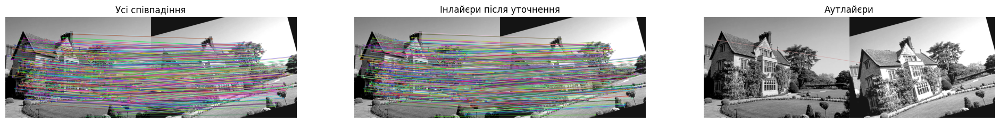

Оригінальне зображення: знайдено 7495 ключових точок
Спотворене зображення: знайдено 9029 ключових точок
Кількість співпадінь (власна функція): 2366
Кількість інлайєрів після RANSAC: 2366
Кількість інлайєрів після уточнення: 2366


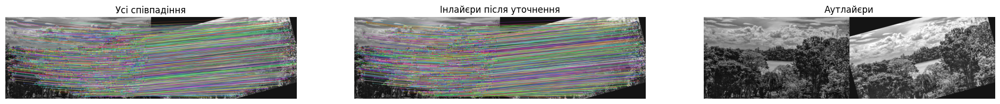

Оригінальне зображення: знайдено 5057 ключових точок
Спотворене зображення: знайдено 6997 ключових точок
Кількість співпадінь (власна функція): 2163
Кількість інлайєрів після RANSAC: 2160
Кількість інлайєрів після уточнення: 2160


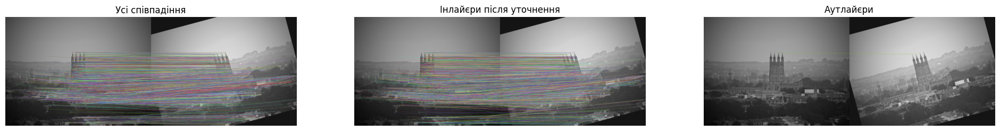

Оригінальне зображення: знайдено 113 ключових точок
Спотворене зображення: знайдено 164 ключових точок
Кількість співпадінь (власна функція): 60
Кількість інлайєрів після RANSAC: 55
Кількість інлайєрів після уточнення: 55


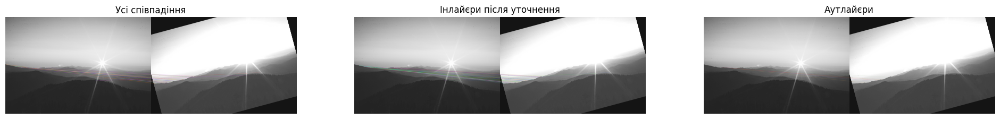

In [ ]:
def draw_inliers(image1, image2, inliers, kp1, kp2):
    inlier_indices = []  # Список для зберігання індексів inlier'ів у списках ключових точок

    # Для кожної пари inlier точок
    for p1, p2 in inliers:
        # Знаходимо індекс ключової точки у першому зображенні, співпадаючої з координатами p1
        idx1 = [i for i, kp in enumerate(kp1) if kp.pt == tuple(p1)]
        # Знаходимо індекс ключової точки у другому зображенні, співпадаючої з координатами p2
        idx2 = [i for i, kp in enumerate(kp2) if kp.pt == tuple(p2)]
        # Якщо знайшли обидва індекси, додаємо пару індексів до списку
        if idx1 and idx2:
            inlier_indices.append((idx1[0], idx2[0]))

    # Створюємо об'єкти відповідностей (DMatch) для inlier'ів з нульовою відстанню (оскільки вони вже відібрані)
    inlier_matches = [cv2.DMatch(i, j, 0) for i, j in inlier_indices]

    # Використовуємо функцію drawMatches для відображення відповідностей між зображеннями
    img_matches = cv2.drawMatches(image1, kp1, image2, kp2, inlier_matches, None,
                                  flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    # Повертаємо зображення з накладеними inlier відповідностями
    return img_matches


def draw_outliers(image1, image2, all_matches, inliers, kp1, kp2):
    # Створюємо множину inlier'ів для швидкого пошуку; кожен inlier представляється парою координат
    inlier_set = set((tuple(p1), tuple(p2)) for p1, p2 in inliers)

    outlier_matches = []  # Список для зберігання відповідностей, що не є inlier'ами

    # Перебираємо всі відповідності, знайдені між зображеннями
    for m in all_matches:
        p1 = kp1[m.queryIdx].pt  # Отримуємо координати точки з першого зображення
        p2 = kp2[m.trainIdx].pt  # Отримуємо координати точки з другого зображення

        # Якщо пара точок не входить до множини inlier'ів, то це outlier
        if (tuple(p1), tuple(p2)) not in inlier_set:
            outlier_matches.append(m)

    # Відображаємо outlier відповідності між зображеннями
    img_matches = cv2.drawMatches(image1, kp1, image2, kp2, outlier_matches, None,
                                  flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    # Повертаємо зображення з накладеними outlier відповідностями
    return img_matches


if __name__ == '__main__':
    for image_path in ['/content/belmond.jpg',
                       '/content/high_cont.jpg',
                       '/content/low_cont.jpg',
                       '/content/sun.jpg']:
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        if image is None:
            raise ValueError("Не вдалося завантажити зображення. Перевірте шлях.")

        distorted_image = distort_image(image)

        kp1, des1 = compute_sift_features(image)
        kp2, des2 = compute_sift_features(distorted_image)

        print(f"Оригінальне зображення: знайдено {len(kp1)} ключових точок")
        print(f"Спотворене зображення: знайдено {len(kp2)} ключових точок")

        my_matches = match_descriptors(des1, des2)
        print(f"Кількість співпадінь (власна функція): {len(my_matches)}")

        points1, points2 = get_points_from_matches(kp1, kp2, my_matches)

        if len(points1) < 4:
            print("Недостатньо точок для обчислення гомографії.")
            continue

        H, inliers_count = ransac_homography(points1, points2)
        print(f"Кількість інлайєрів після RANSAC: {inliers_count}")

        H_refined, inliers = iterative_refinement(points1, points2, H)
        print(f"Кількість інлайєрів після уточнення: {len(inliers)}")

        img_all_matches = cv2.drawMatches(image, kp1, distorted_image, kp2, my_matches, None,
                                          flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
        img_inliers = draw_inliers(image, distorted_image, inliers, kp1, kp2)
        img_outliers = draw_outliers(image, distorted_image, my_matches, inliers, kp1, kp2)

        plt.figure(figsize=(24, 8))

        plt.subplot(1, 3, 1)
        plt.imshow(img_all_matches, cmap='gray')
        plt.title("Усі співпадіння")
        plt.axis("off")

        plt.subplot(1, 3, 2)
        plt.imshow(img_inliers, cmap='gray')
        plt.title("Інлайєри після уточнення")
        plt.axis("off")

        plt.subplot(1, 3, 3)
        plt.imshow(img_outliers, cmap='gray')
        plt.title("Аутлайєри")
        plt.axis("off")

        plt.show()

**Висновок**: У ході виконання роботи було реалізовано суміщення зображень на основі використання дескрипторів, зокрема методу SIFT (Scale-Invariant Feature Transform). Основною перевагою SIFT є його інваріантність до змін масштабу, повороту, освітленості та часткових афінних перетворень. Це досягається шляхом виявлення ключових точок у різних масштабах та обчислення їх дескрипторів на основі градієнтів інтенсивності. Для перевірки відповідностей між ключовими точками було реалізовано власну функцію матчінгу, результати якої порівнювалися із засобами OpenCV (KNN метчер). Окрім того, для фільтрації хибних відповідностей використовувався алгоритм RANSAC (Random Sample Consensus), який дозволяє визначити параметри геометричних перетворень, таких як кут повороту, зміщення в напрямках X та Y. Метод RANSAC є ефективним у присутності викидів, оскільки вибирає підмножину відповідностей і обчислює модель, що найкраще підходить до більшості даних.